In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches
import mplstereonet
import skimage.exposure
import harmonica as hm
import verde as vd

import micromag as mg

import time

# Read QDM data

First, we create a read the observation points.

In [2]:
nc_file = "NRM2.mat"
data_dir = pathlib.Path("")/"real-data"
data = mg.load_qdm(data_dir / nc_file)

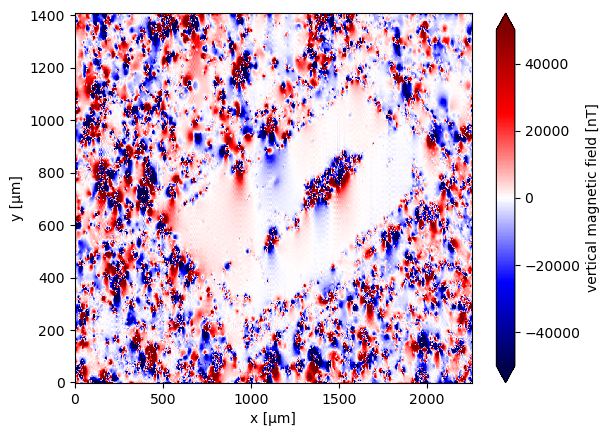

In [3]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

In [4]:
# copy data sets
data_copy = data.copy(deep=True)
data_copy2 = data_copy.copy(deep=True)

x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

# Anomaly detection

First part of our method is an automatic way to detect and separate the signal of each dipole in the data. This is done in the following steps:

1. Upward continue the data to suppress high frequency noise
2. Calculate the total gradient amplitude (TGA) to concentrate the anomalies on top of the sources
3. Contrast stretch the TGA to highlight weaker sources
4. Run the Laplacian of Gaussian (LoG) method for blog detection to find the anomalies

## 1. Upward continue the data to suppress the high-frequency noise

In this step, we want to upward continue as little as possible to make sure we retain most of the signal.

In [5]:
height_difference = 5

# Have to assign the same points as the data because the Harmonica
# transforms give slightly different coordinates due to round-off.
# This is a bug and is being worked on.
data_up = (
    hm.upward_continuation(data.bz, height_difference)
    .assign_attrs(data.bz.attrs)
    .to_dataset(name="bz")
    .assign_coords(x=data.x, y=data.y)
    .assign_coords(z=data.z + height_difference)
)
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 9MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -6.493e+03 -3.142e+03 ... -1.004e+04 -8.092e+03

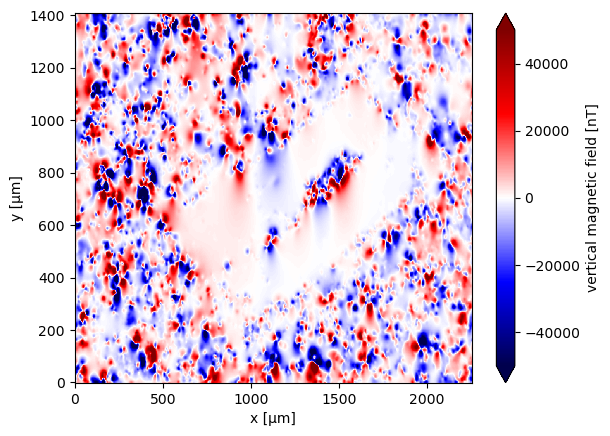

In [6]:
data_up.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

## 2. Calculate the TGA

We do this with finite difference derivatives to avoid amplifying noise.

In [7]:
data_up = data_up.assign(mg.data_gradients(data_up.bz))
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -6.493e+03 -3.142e+03 ... -1.004e+04 -8.092e+03
    tga      (y, x) float64 5MB 2.177e+03 2.242e+03 ... 1.84e+03 1.148e+03
    x_deriv  (y, x) float64 5MB 1.426e+03 1.302e+03 1.091e+03 ... 376.5 830.7
    y_deriv  (y, x) float64 5MB -1.483e+03 -1.291e+03 -997.2 ... -823.3 -514.0
    z_deriv  (y, x) float64 5MB -710.5 -1.291e+03 -1.377e+03 ... 1.602e+03 602.3

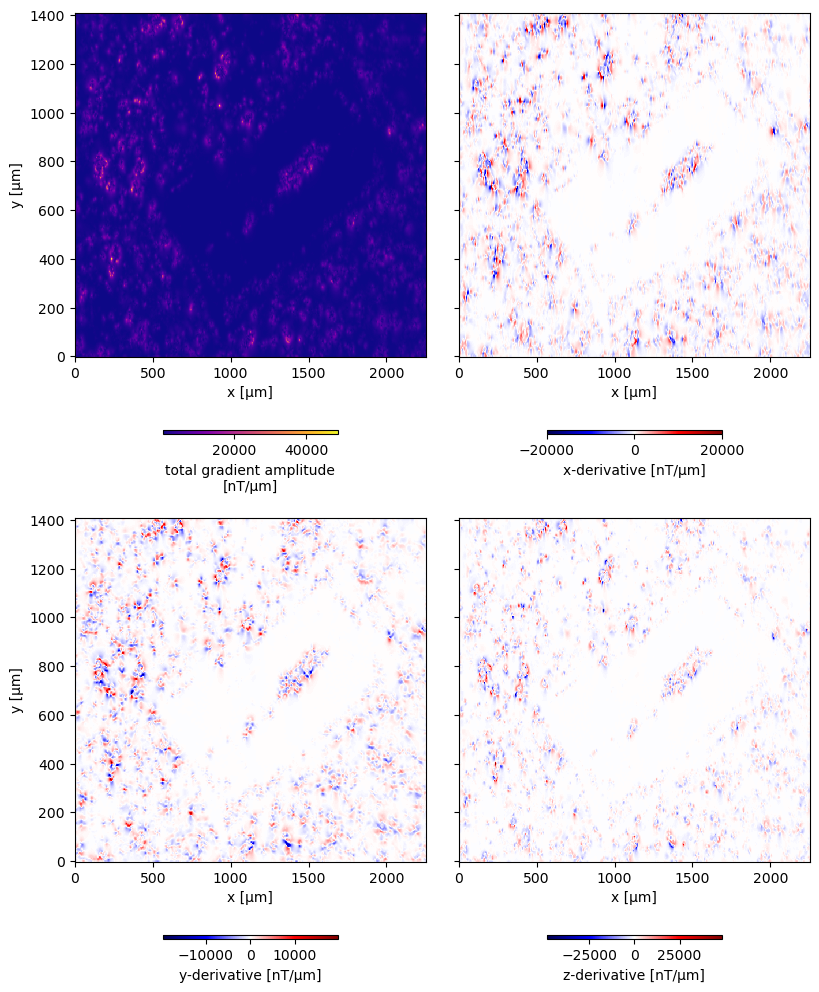

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(8, 10), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "x_deriv", "y_deriv", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
    else:
        cmap="seismic"
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs)
for ax in axes.ravel():
    ax.set_aspect("auto")
    
axes[0,1].set_ylabel(None)
axes[1,1].set_ylabel(None)
plt.tight_layout(pad=0, h_pad=0, w_pad=2)

## 3. Stretch the contrast

Now we need to stretch the contrast of the TGA to make the anomalies easier to detect.

In [9]:
stretched = skimage.exposure.rescale_intensity(
    data_up.tga, 
    in_range=tuple(np.percentile(data_up.tga, (1, 99))),
)
data_up = data_up.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

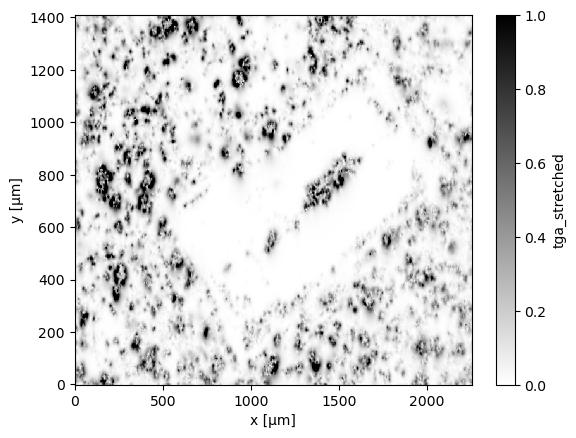

In [10]:
data_up.tga_stretched.plot.pcolormesh(cmap="gray_r")

## 4. Blob detection

To detect the bounding boxes of each anomaly, we use the LoG method in scikit-image. The code below calls it with some conveniences, like passing the range of anomaly sizes in physical units (µm) instead of number of pixels. It returns the bounding box of each anomaly (x_min, x_max, y_min, y_max) also in physical units.

In [11]:
start_detection_time = time.perf_counter()

windows = mg.detect_anomalies(
    data_up.tga_stretched, 
    size_range=[20, 100],
    size_increment=1.0,
    threshold=0.05,
    overlap=1.0,
    exclude_border=30,
    nsizes=20,
)

end_detection_time = time.perf_counter()

In [12]:
detection_time = end_detection_time-start_detection_time

print(f'{np.shape(windows)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

751 potential sources detected within 1.8559 seconds


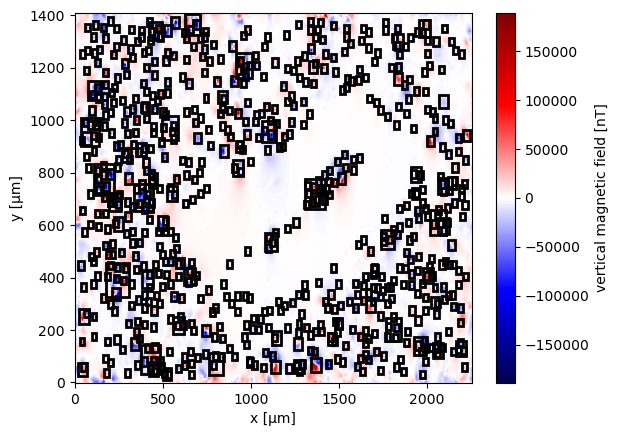

In [13]:
ax = plt.subplot(111)
data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

Now that we know the bounding box of each anomaly, we can run the Euler deconvolution and moment inversion for each anomaly separately.

# Euler Deconvolution and Inversion (Standard method)

Run the Euler Deconvolution and the inversion on each window.

In [14]:
start_inversion_time = time.perf_counter()

positions = []
estimated_dipole_moments = []
estimated_stds = []
calculated_r2 = []
calculated_SNR = []
windows_filtered = []
base_levels = []
for window in windows:
    anomaly = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
#     anomaly = data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    data_minus_background = anomaly.bz.values - base_level
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    moment, covariance, r2, SNR = mg.dipole_moment_inversion(
        anomaly.data_minus_background, position,
    )
    
    # Filter out solutions that don't meet quality criteria
    bad_euler = False # position[2] > 0
    poor_fit = False
    
#    bad_euler = position[2] > 0
#     poor_fit = r2 < 0.85
    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s"%(r2,SNR))  
    positions.append(position)  
    estimated_dipole_moments.append(moment)
    estimated_stds.append(mg.covariance_to_angle_std(moment, covariance))
    calculated_r2.append(r2)
    calculated_SNR.append(SNR)
    windows_filtered.append(window)
    base_levels.append(base_level)
positions = np.transpose(positions)


end_inversion_time = time.perf_counter()

In [15]:
inversion_time = end_inversion_time-start_inversion_time
print(f"{positions.shape[1]} euler positions and dipole moments estimated within {round(inversion_time, 4)} seconds", )

751 euler positions and dipole moments estimated within 3.471 seconds


# Iterative Euler deconvolution

In [16]:
import scipy as sp
import numba
import choclo
# @numba.jit(nopython=True, parallel=True)
def goal_function(parameter, obs_data, coordinates, amplitude, x_0, y_0, z_0):
    bz = mg.dipole_bz(coordinates, 
                      ([parameter[0]*x_0], [parameter[1]*y_0], [parameter[2]*z_0]),
                     np.array([parameter[3], parameter[4], parameter[5]])*amplitude
                     )
                   
    
    Res = np.linalg.norm(obs_data-bz.ravel())
    # print(Res)
    return(Res)

In [17]:
x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

In [18]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()


x_concat = []
y_concat = []
z_concat = []
bz_concat = []
xc_concat = []
yc_concat = []
zc_concat = []
z_deriv_concat = []

estimated_dipole_moments_itr_euler = []

# fitting parameters
calculated_r2_itr_euler = []
calculated_SNR_itr_euler = []

data_copy = data.copy(deep=True)
data_up_copy = data_up.copy(deep=True)

base_levels_itr_euler = []
#################################
for window in rich.progress.track(np.array(windows), total = len(np.array(windows))):
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )

    base_levels_itr_euler.append(base_level)
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2


    estimated_dipole_moments_itr_euler.append(moment)
    
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard
    
#     print(discard.max())
    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s | %s"%(r2,SNR,position[2]))  
    xx, yy = np.meshgrid(anomaly.x.values, anomaly.y.values)
    x_concat = np.append(x_concat, xx)
    y_concat = np.append(y_concat, yy)    
    z_concat = np.append(z_concat, anomaly.z.values)
    bz_concat = np.append(bz_concat, anomaly.bz.values)
    z_deriv_concat = np.append(z_deriv_concat, anomaly.z_deriv.values)
    xc_concat = np.append(xc_concat, position[0])
    yc_concat = np.append(yc_concat, position[1])
    zc_concat = np.append(zc_concat, position[2])
    calculated_r2_itr_euler = np.append(calculated_r2_itr_euler, r2)
    calculated_SNR_itr_euler = np.append(calculated_SNR_itr_euler, SNR)


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

In [19]:
itr_euler_time = end_itr_euler_time-start_itr_euler_time
print(f"Time for the iterative Euler solution and dipole moment estimation: {round(itr_euler_time, 4)} seconds", )

Time for the iterative Euler solution and dipole moment estimation: 223.2488 seconds


In [20]:
df = pd.DataFrame({'x':x_concat,
                   'y':y_concat,
                   'z':z_concat,
                  'bz':bz_concat,
                 'z_deriv':z_deriv_concat})

df.head()

,x,y,z,bz,z_deriv
0,789.60,1130.35,10.0,-12764.631038,-450.046902
1,791.95,1130.35,10.0,-19422.716160,639.089208
2,794.30,1130.35,10.0,-25920.934010,1832.652141
3,796.65,1130.35,10.0,-30518.832367,2781.493701
4,799.00,1130.35,10.0,-31624.043181,3108.879822


In [21]:
positions_itr = np.array([xc_concat, yc_concat, zc_concat])

In [22]:
# indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# indexes
# euler_r2_itr_cond

Output()

Output()

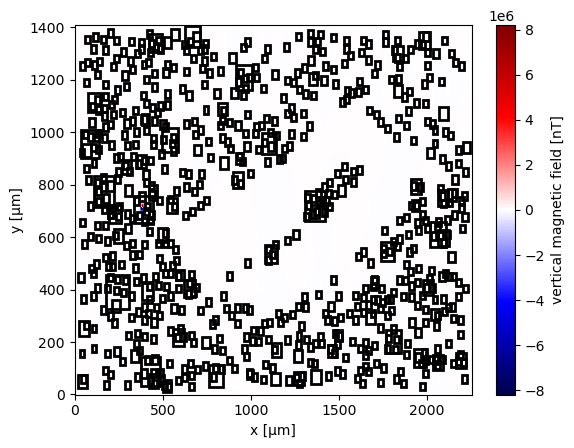

In [23]:
## EULER ENHANCEMENT SECOND STEP
warnings.filterwarnings("ignore")
data_copy = data.copy(deep=True)
euler_r2_itr_cond = calculated_r2_itr_euler>=0.999

zc_concat_temp = list()
xc_concat_temp = list()
yc_concat_temp = list()

estimated_dipole_moments_itr_euler_temp = list()

indexes = np.where(np.array(euler_r2_itr_cond))[0]
# SOURCES WITH R2 >= 0.99 ARE NOT ENHANCED, WE CALCULATE THEIR ANOMALY AND REMOVE THEM FROM THE DATA SET
# for index, window in enumerate(rich.progress.track(np.array(windows)[euler_r2_itr_cond], total=len(np.array(windows)[euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    position = positions_itr[:, index]
    estimated_dipole_moments_itr_euler_temp.append(estimated_dipole_moments_itr_euler[index])
    xc_concat_temp = np.append(xc_concat_temp, position[0])
    yc_concat_temp = np.append(yc_concat_temp, position[1])
    zc_concat_temp = np.append(zc_concat_temp, position[2])  

    
# remove all signals 
position_temp = np.array([xc_concat_temp, yc_concat_temp, zc_concat_temp])
discard = mg.dipole_bz(coordinates, position_temp, estimated_dipole_moments_itr_euler_temp)
data_copy.bz.values -= discard

data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))

# SOURCES WITH R2 <= 0.99 ARE ENHANCED
indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# for index, window in enumerate(rich.progress.track(np.array(windows)[~euler_r2_itr_cond], total=len(np.array(windows)[~euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}
    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)



    ## SCIPY MINIMIZATION
    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
        
        if r2 >= calculated_r2_itr_euler[index]:
            estimated_dipole_moments_itr_euler[index] = moment
            positions_itr[:, index] = position
    
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))



ax = plt.subplot(111)
data_up_copy.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   


# Comparison plots

## Euler comparison

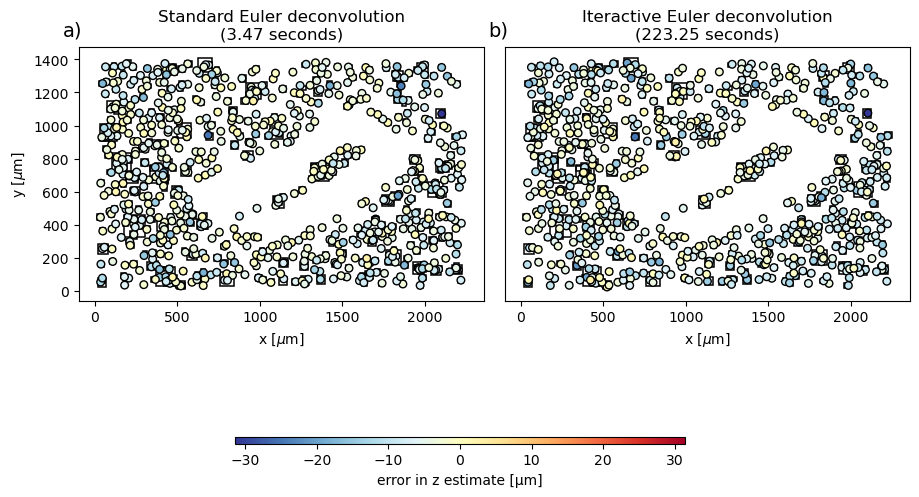

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(9, 9))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.015, shrink=0.5)

# data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
axes = axes.ravel()

scale = vd.maxabs((positions[2]))

ax = axes[0]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions[:2], c=positions[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

ax = axes[1]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

titles = ([r'Standard Euler deconvolution'   +'\n'+ f'({round(inversion_time, 2)} seconds)', 
           r'Iteractive Euler deconvolution' +'\n'+ f'({round(itr_euler_time, 2)} seconds)'])
for ax, letter, title in zip(axes, "a b".split(), titles):
    ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(r"x [$\mu$m]")

axes[1].set_yticks([])
axes[0].set_ylabel(r"y [$\mu$m]")
plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


fig.colorbar(tmp, **cbar_kwargs, label="error in z estimate [µm]", cax=fig.add_axes([0.25, 0.2, 0.5, 0.0075]))


plt.show()

In [25]:
fig_dir = pathlib.Path("..") / "paper" / "figures"
mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

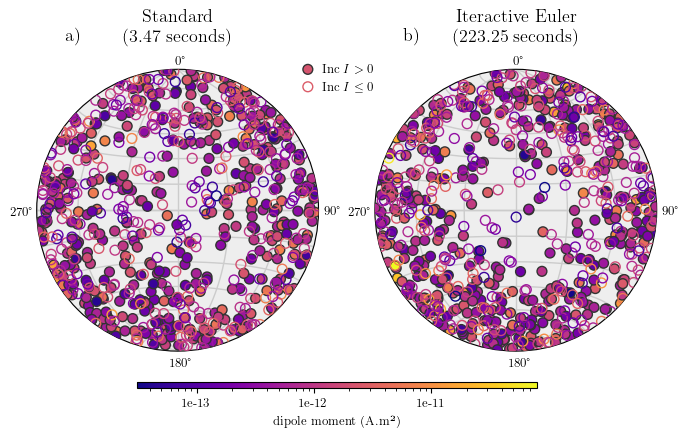

In [26]:
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(8, 4))
    axes = []

#     estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
#     vmin = np.min(estimated)
#     vmax = np.max(estimated)
    
    estimated1 = mg.vector_to_angles(estimated_dipole_moments)[2]
    estimated2 = mg.vector_to_angles(estimated_dipole_moments_itr_euler)[2]

    
    vmin = np.min([np.min(estimated1),np.min(estimated2)])
    vmax = np.max([np.max(estimated1),np.max(estimated2)])
    
    cmap = "plasma"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize

        
    ## STANDARD METHOD
    ax = fig.add_subplot(1, 2, 1, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs)
    ax.legend(loc=(0.9, 0.9), frameon=False, handletextpad=0.1, prop = {'size' : 9})
    fig.colorbar(
        tmp, 
        cax=fig.add_axes([0.25, 0.05, 0.5, 0.015]), 
        format="%.0g",
        label="dipole moment (A.m²)",
        orientation="horizontal",
    )

    
    ## ITERACTIVE METHOD
    ax = fig.add_subplot(1, 2, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs)

    
    ######
    titles = ([r'Standard'+'\n'+ f'({round(inversion_time, 2)} seconds)', 
           'Iteractive Euler'+'\n'+ f'({round(itr_euler_time, 2)} seconds)']) 
 

    for ax, letter, title in zip(axes, "a b".split(), titles):
        ax.text(0.1, 1.1, f"{letter})   ", transform=ax.transAxes, fontsize=13)
        ax.set_title(title+'\n', fontsize=13, loc='center')
    fig.subplots_adjust(wspace=0.2, hspace=0.5)

    plt.show()


# Paper's figures 

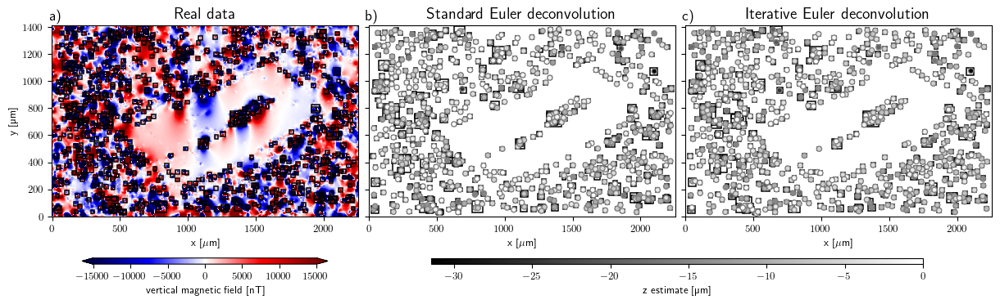

In [27]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data_up['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir/"euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


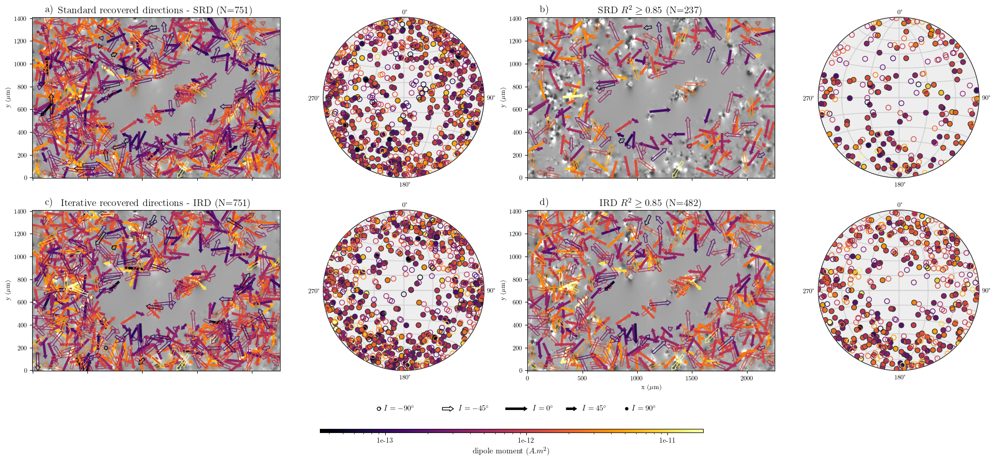

In [28]:
import warnings
warnings.filterwarnings('ignore')

r_square_filter = 0.85

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments_itr_euler, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)   

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r_square_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r_square_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir/"real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    # fig.savefig("real-data-stereograms.pdf", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

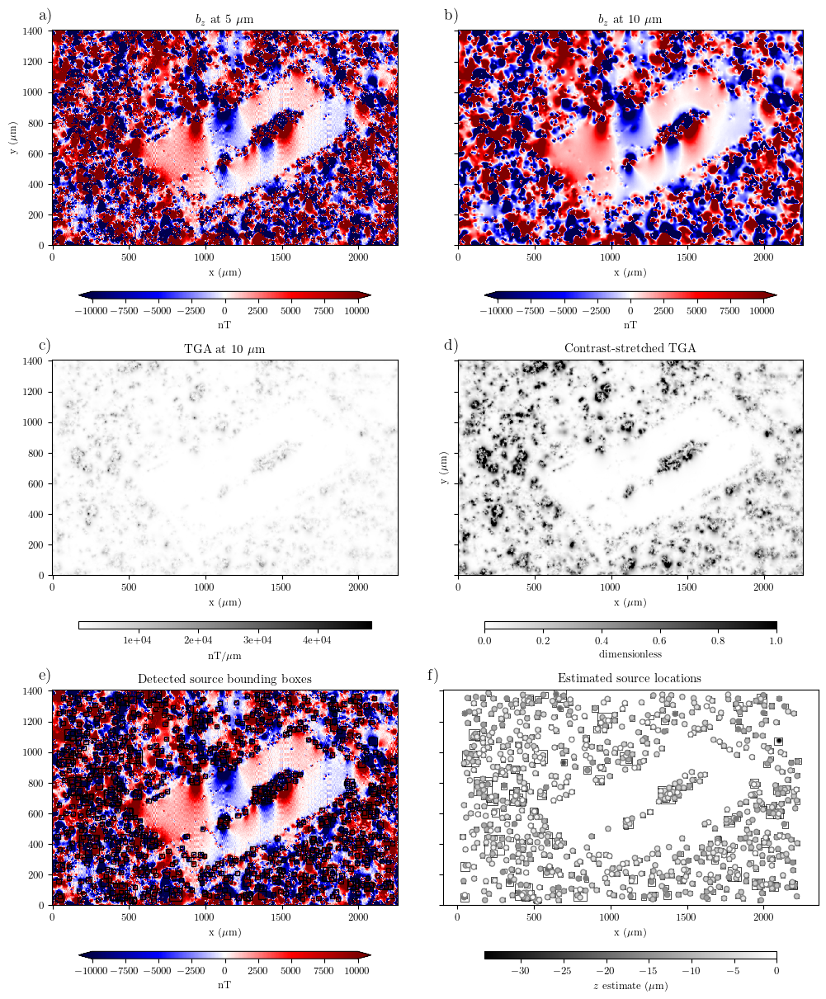

In [29]:
sensor_sample_distance = float(data.z.values.mean())
vmax=+10000
vmin=-10000
with plt.rc_context(mpl_rc):

    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey="row")
    axes = axes.ravel()    
    cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.5)
    
    ax = axes[0]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    

    ax = axes[1]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    
    ax = axes[2]   
    ax.set_aspect("equal")
    ax.set_title(f"TGA at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.tga.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="nT/$\mu$m", **cbar_kwargs, format="%.0e")
    
    ax = axes[3]  
    ax.set_aspect("equal")
    ax.set_title(f"Contrast-stretched TGA")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data_up.tga_stretched.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="dimensionless", **cbar_kwargs)
    
    ax = axes[4]  
    ax.set_aspect("equal")
    ax.set_title(f"Detected source bounding boxes")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')    
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)   
    
        
    ax = axes[5]  
    ax.set_aspect("equal")
    ax.set_title(f"Estimated source locations")
    ax.set_xlabel("x ($\mu$m)")
    scale = 100
#     tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r",  add_colorbar=False, add_labels=False)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=0.5,
        )
        ax.add_patch(rect)
    scale = vd.maxabs(positions_itr[2])
    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')
    fig.colorbar(tmp, ax=ax, label="$z$ estimate ($\mu$m)", **cbar_kwargs)    
    
    for ax, letter in zip(axes, "a b c d e f".split()):
        ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)

    plt.tight_layout(pad=0, h_pad=0, w_pad=-10)
    
    # fig.savefig("processing_steps.png", dpi=300, facecolor='w', bbox_inches='tight')
    
    plt.show()

In [30]:
data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


In [31]:
data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
data_up_copy

<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -6.332e+03 -2.942e+03 ... -1.005e+04 -8.084e+03
    tga      (y, x) float64 5MB 2.173e+03 2.256e+03 ... 1.816e+03 1.127e+03
    x_deriv  (y, x) float64 5MB 1.443e+03 1.311e+03 1.086e+03 ... 381.1 836.5
    y_deriv  (y, x) float64 5MB -1.428e+03 -1.222e+03 -922.2 ... -804.9 -483.4
    z_deriv  (y, x) float64 5MB -775.6 -1.371e+03 -1.462e+03 ... 1.582e+03 580.0

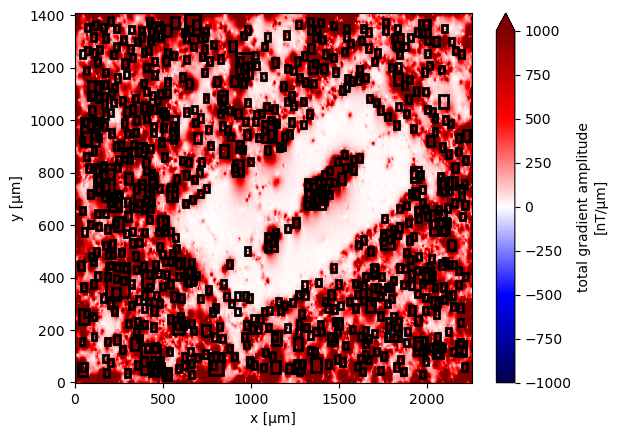

In [32]:
ax = plt.subplot(111)
scale=1000
data_up_copy.tga.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-scale, vmax=scale)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

In [33]:
stretched = skimage.exposure.rescale_intensity(
    data_up_copy.tga, 
    in_range=tuple(np.percentile(data_up_copy.tga, (1, 99))),
)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

In [34]:
start_detection_time = time.perf_counter()

windows_new = mg.detect_anomalies(
    data_up_copy.tga_stretched, 
    size_range=[20,150],
    size_increment=1.3,
    threshold=0.025,
    overlap=0.0,
    exclude_border=15
)
# windows
end_detection_time = time.perf_counter()

In [35]:
detection_time = end_detection_time-start_detection_time
print(f'{np.shape(windows_new)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

685 potential sources detected within 1.3881 seconds


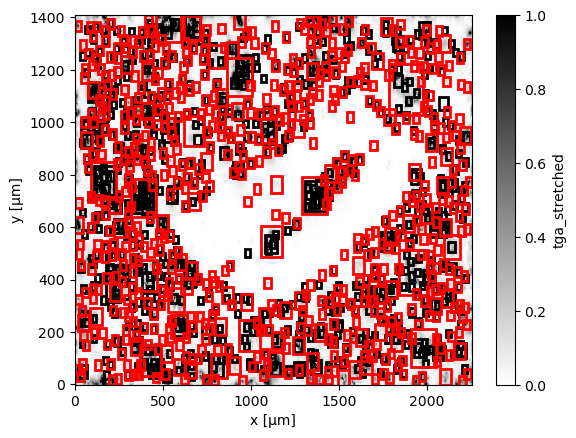

In [36]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

for window in windows_new:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [37]:
def intersects(window1, window2):
    # Verifica se há sobreposição horizontal
    horizontal_overlap = (window1[0] <= window2[1]) and (window2[0] <= window1[1])
    # Verifica se há sobreposição vertical
    vertical_overlap = (window1[2] <= window2[3]) and (window2[2] <= window1[3])
    return horizontal_overlap and vertical_overlap
    


# Remove overlapping windows
non_overlapping_windows = np.copy(windows_new)

for window in windows:
    non_overlapping_windows = [nw for nw in non_overlapping_windows if not intersects(nw, window)]

print("Non-overlapping windows:")
for window in non_overlapping_windows:
    print(window)

Non-overlapping windows:
[ 903.63732969  966.96267031 1357.18732969 1420.51267031]
[195.46522369 232.23477631  -1.93477631  34.83477631]
[1537.31522369 1574.08477631 1368.11522369 1404.88477631]
[2211.76522369 2248.53477631 1281.16522369 1317.93477631]
[  -1.93477631   34.83477631 1349.31522369 1386.08477631]
[1920.36522369 1957.13477631   -4.28477631   32.48477631]
[1769.96522369 1806.73477631    5.11522369   41.88477631]
[1493.48732969 1556.81267031   -8.16267031   55.16267031]
[1950.91522369 1987.68477631  573.81522369  610.58477631]
[933.36522369 970.13477631  -4.28477631  32.48477631]
[2185.91522369 2222.68477631   -4.28477631   32.48477631]
[1687.71522369 1724.48477631    2.76522369   39.53477631]
[2073.93732969 2137.26267031   -3.46267031   59.86267031]
[ 282.41522369  319.18477631 1057.91522369 1094.68477631]
[1694.76522369 1731.53477631  134.36522369  171.13477631]
[226.01522369 262.78477631   2.76522369  39.53477631]
[  2.76522369  39.53477631 305.91522369 342.68477631]
[2207

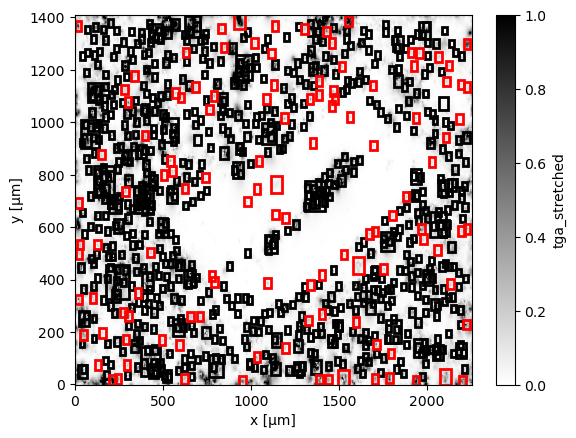

In [38]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [39]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()

data_copy_2 = data_copy.copy(deep=True)
data_up_copy_2 = data_up_copy.copy(deep=True)

positions_itr_enhanced = list(np.copy(positions_itr))
estimated_dipole_moments_itr_euler_enhanced = list(np.copy(estimated_dipole_moments_itr_euler))
windows_enhanced = list(np.copy(windows))
calculated_r2_itr_euler_enhanced = list(np.copy(calculated_r2_itr_euler))
base_levels_itr_euler_enhanced = list(np.copy(base_levels_itr_euler))

#################################
for window in rich.progress.track(np.array(non_overlapping_windows), total = len(np.array(non_overlapping_windows))):
    anomaly = data_up_copy_2.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    base_levels_itr_euler_enhanced.append(base_level)
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
    else:
        print('piorou')


    windows_enhanced.append(window)
    estimated_dipole_moments_itr_euler_enhanced.append(moment)
    for i in range(3):
        positions_itr_enhanced[i]=np.append(positions_itr_enhanced[i], position[i])
    calculated_r2_itr_euler_enhanced.append(r2)
    # estimated_dipole_moments_itr_euler.append(moment)
    print(position)
    print(moment)
    print(mg.vector_to_angles(moment))
    print(r2)
    print()
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy_2.bz.values -= discard
    
#     print(discard.max())
    data_up_copy_2 = (
                hm.upward_continuation(data_copy_2.bz, height_difference)
                .assign_attrs(data_copy_2.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy_2.x, y=data_copy_2.y)
                .assign_coords(z=data_copy_2.z + height_difference)
                   )
    
    
    data_up_copy_2 = data_up_copy_2.assign(mg.data_gradients(data_up_copy_2.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

piorou

[ 931.10300893 1388.47724439   -6.69127638]

[-6.06132848e-14  3.30773723e-12  5.36555151e-13]

(-9.212296868899749, -1.0498103411686006, 3.351520701226492e-12)

0.7848979485722599

[211.9227584   16.85187883  -8.99101998]

[-2.56896212e-12  3.46975299e-13 -1.24873748e-12]

(25.720695282218742, -82.30792906145116, 2.877377886561429e-12)

0.9601634575689623

[1559.82640942 1389.71422602  -11.24875285]

[ 2.85810991e-12  3.23517712e-12 -1.16449701e-12]

(15.096566107173086, 41.45891527242575, 4.471153826691805e-12)

0.9261861962878644

[2234.26076496 1301.19458814  -10.63591051]

[-2.29402173e-12 -1.41014019e-12  4.70315667e-13]

(-9.907255672989436, -121.57913362312827, 2.7335376179606764e-12)

0.9423752541458739

[  14.31600875 1371.65771855   -9.26120005]

[ 1.09719587e-12 -1.23187846e-12  3.10989145e-13]

(-10.675970494846148, 138.3095379915736, 1.6787130637766293e-12)

0.9558065937511

[1934.9001357    13.84570204  -11.23633743]

[-2.70538377e-12 -1.23648489e-12 -7.43885841e-13]

(14.040708573574028, -114.56258192275908, 3.0661641104035542e-12)

0.9452308243824796

[1789.44955911   26.35880827   -4.19952175]

[-1.36844224e-13 -5.67509095e-13 -2.11903806e-14]

(2.07886111776079, -166.44299227443767, 5.841591796134069e-13)

0.889196117067538

piorou

[1529.00531411   20.92244696   -2.72965158]

[-1.51259254e-13 -3.17984858e-14  1.34247453e-14]

(-4.9639511973753745, -101.87212895940124, 1.5514744377036568e-13)

-0.04947105470515756

piorou

[1963.2694708   593.45217883   -2.75190159]

[5.62750496e-14 4.99151981e-14 2.19735518e-13]

(-71.10230860624027, 48.42741360405793, 2.32254399384618e-13)

0.4051283291348682

[948.96069092  11.71170242 -10.13105168]

[ 9.80610248e-13 -5.10151044e-14  8.40600000e-13]

(-40.56562953943789, 92.97806135144546, 1.2925971373702604e-12)

0.923467038517862

[2199.18213714   24.07078955  -13.67845535]

[ 2.01054398e-12 -2.33603043e-12  6.84661483e-13]

(-12.524395135847945, 139.28251235437295, 3.1572276791195575e-12)

0.7654774551321336

[1705.25167753   17.31274295   -7.33548025]

[2.39470106e-13 6.16323885e-13 1.78332119e-13]

(-15.093819051384665, 21.233432313936625, 6.848382350608579e-13)

0.9687426418656443

[2118.63373227   24.12393404  -29.22165334]

[ 4.68157618e-12  9.25510727e-12 -1.60284443e-12]

(8.784923210611593, 26.831976774689004, 1.0494916687550766e-11)

0.8130353689610341

[ 294.92378356 1078.31711744   -3.76288817]

[-1.54495886e-13  1.97313915e-13 -9.98006449e-14]

(21.714541364130625, -38.06078032715382, 2.6974419135510075e-13)

0.8009183612725097

piorou

[1702.69943615  154.08926898   -2.46357799]

[-1.87111011e-13  7.41547060e-15  1.87631344e-14]

(-5.721906262708009, -87.73047597501885, 1.8819557598552708e-13)

0.5313758678238256

[244.28031828  21.67331889  -6.21895777]

[ 3.86614588e-13  4.09484872e-13 -6.88521285e-14]

(6.970413398309617, 43.354463838891085, 5.673529024785103e-13)

0.9759604453284134

piorou

[ 19.80539261 321.92974484  -2.81029865]

[ 9.22093042e-15 -5.97794641e-14 -1.18195272e-13]

(62.8988985420026, 171.23128403424093, 1.327732362704431e-13)

0.2744562328219372

piorou

[2246.15870252  219.71123622   -5.71022073]

[-4.11973950e-14 -1.77747954e-13 -8.20396216e-13]

(77.4612443845744, -166.95072454853718, 8.404412600903875e-13)

0.4762420694877765

[1384.7211021    11.69948525   -3.49395449]

[ 4.90357451e-14 -3.04274047e-13 -1.20089806e-13]

(21.28832722849135, 170.8451253153099, 3.3076995203147055e-13)

0.5175800751689968

[1425.08445312 1356.23668565   -3.95308033]

[-2.11335630e-13  2.82191465e-13 -7.47535143e-14]

(11.971342003833227, -36.829857744554836, 3.6039264610891045e-13)

0.7097020560049465

[ 45.40572397 188.58959178 -16.7579509 ]

[5.68352264e-13 9.54995774e-13 2.20170568e-12]

(-63.21736617094051, 30.758395586200766, 2.4662824487923285e-12)

0.9358561077995804

piorou

[1.40214943e+03 2.71264121e+02 1.01840325e+00]

[-4.35193401e-14 -2.57977737e-14 -4.45190574e-15]

(5.028950055446102, -120.65898373187594, 5.0786588298041684e-14)

0.7198748095760275

[661.8334737  254.92198348 -16.31229647]

[ 9.11963007e-13 -9.79261046e-13 -9.92005975e-13]

(36.55064569949071, 137.0379749815339, 1.665744450757803e-12)

0.9696133591175069

[1190.16821202 1015.3294337    -5.36533702]

[1.33000055e-13 1.26939955e-13 6.25726443e-14]

(-18.7953078614216, 46.33552082400633, 1.9421148916267712e-13)

0.8838784696264554

piorou

[2.82538066e+02 7.49325147e+02 6.19646159e-01]

[-5.17644211e-16 -2.14141668e-14 -4.89705391e-15]

(12.877435148292015, -178.6152599840759, 2.1973066112397366e-14)

0.06125176780493102

[1388.01375503 1162.92196105   -4.93657563]

[-2.15639750e-13 -1.79328377e-13 -5.56791697e-14]

(11.228720936960022, -129.7472811305526, 2.8593589941744876e-13)

0.8632866385408492

piorou

[ 641.51050956 1264.51676435   -7.59734103]

[ 3.53455196e-13 -1.56125940e-13  4.81050692e-14]

(-7.096532976347787, 113.83169594460776, 3.893841071286547e-13)

0.3883965067323406

[300.32907388 258.80324149 -16.17669182]

[-1.83884948e-12  1.07715220e-12 -1.91149936e-13]

(5.1254330569886974, -59.63929112040067, 2.139664129155385e-12)

0.9109245076756239

piorou

[ 791.8118223  1101.05014284   -2.71102939]

[-5.15705705e-14  4.77413249e-17 -1.01391312e-13]

(63.04077743006822, -89.94695859254692, 1.1375290849335954e-13)

0.8967635832227995

[1336.74837351 1092.73866381   -3.14881299]

[-7.64095857e-14  1.12385403e-13 -4.03522983e-14]

(16.537504909535087, -34.21134827702644, 1.4176463436571017e-13)

0.8574061697980017

[397.17294416 940.13813431 -12.5825214 ]

[2.49519665e-13 1.22658112e-12 8.61588848e-14]

(-3.9376470641793775, 11.498605719074522, 1.2546651589401844e-12)

0.9177679622495314

[1671.62138643  575.07359047   -2.9278837 ]

[ 1.04355866e-13  2.14847911e-14 -1.68315487e-14]

(8.97720371397759, 78.36649249841041, 1.0786586140115795e-13)

0.7514694206614168

[1.70424772e+03 5.81951765e+02 1.25653747e+00]

[ 4.45301693e-15 -2.85533576e-14  3.44575571e-16]

(-0.6831422736915964, 171.13588402076448, 2.8900559177209716e-14)

0.5349304830468605

[1049.67569365  850.50024479   -5.37520349]

[-1.31933853e-13  6.56773480e-14  7.56469730e-14]

(-27.170884196602934, -63.535642806637696, 1.6565784027575983e-13)

0.9663024913769682

piorou

[1.46896115e+03 1.11288325e+03 1.73544036e-01]

[-2.39427018e-15 -3.91747442e-14 -2.10801226e-14]

(28.24036615545163, -176.502564280032, 4.455069791157993e-14)

0.6760341883700224

[1327.59609585  242.80284463  -11.46285856]

[9.06846212e-13 7.61158610e-14 3.30968698e-14]

(-2.082860077190178, 85.20214210388625, 9.106366341485462e-13)

0.962411728504863

[1046.2942078   110.27077356  -14.46150372]

[-9.57799902e-13 -4.41021950e-14 -7.95077564e-13]

(39.666528280202385, -92.63633991170363, 1.2455817867068496e-12)

0.8366698805180328

piorou

[1.51870824e+03 1.21987036e+03 2.76162437e-01]

[ 1.71127799e-14  1.85818301e-14 -1.71063306e-14]

(34.10492451481699, 42.6432604076342, 3.0508329863774045e-14)

0.434413006438104

[1432.64028404   18.4571925    -6.58939881]

[-4.48281529e-13  2.42348767e-13 -1.90625385e-13]

(20.509352706831542, -61.60357547467918, 5.440839010077802e-13)

0.8466888646342491

[1958.97391563 1269.87502955   -3.51632371]

[-1.56274368e-14 -8.86046623e-14  7.24436325e-14]

(-38.840240764917475, -169.99746367480446, 1.1551226279041484e-13)

0.8446852571953025

[1478.9314219  1084.29595672   -3.23978126]

[ 3.95646028e-14 -8.46263887e-14 -3.25435328e-14]

(19.206470707698166, 154.94292992544862, 9.892454191669694e-14)

0.7684102935023623

[ 26.54378398 531.65730328 -17.10758491]

[-1.80178464e-12  9.99381922e-13 -9.12476013e-13]

(23.886945819086385, -60.98452196831762, 2.253398451167419e-12)

0.9077072319458851

piorou

[ 1.09198962e+03  3.82864510e+02 -2.95459330e-01]

[-3.08198138e-15 -2.99128611e-14 -1.52331784e-14]

(26.865411596081245, -174.11745919530134, 3.3709458519155545e-14)

0.6518818022587765

[1805.55339912  645.70042751   -7.23223932]

[ 6.90266797e-14  1.54691890e-13 -1.12364996e-13]

(33.55774513906905, 24.047404259984692, 2.0327359817750758e-13)

0.9622400814354493

[1616.7910226   444.19485513   -9.96434293]

[-2.44873601e-13  3.80238724e-13  5.53306022e-14]

(-6.974952337134928, -32.78152058832416, 4.556380620003725e-13)

0.5666039026222811

[2204.03227627  584.87549777  -10.49841285]

[ 3.84975459e-13 -1.33592682e-13 -1.80210222e-13]

(23.856828564771348, 109.13759742395666, 4.4556574501135557e-13)

0.8754764190921217

[1016.49406165 1296.24586233   -9.11518825]

[2.40885115e-13 2.14935002e-13 6.82670659e-14]

(-11.93992391717353, 48.258366007180875, 3.299743714279111e-13)

0.9608914648532572

piorou

[ 6.04558089e+02  1.09747111e+03 -6.13543169e-02]

[ 4.26076364e-14  3.88714506e-14 -2.48794900e-15]

(2.4700610046693527, 47.62543234057671, 5.772859118999513e-14)

0.5572327745469693

[1377.75960171 1111.40769343  -20.43891771]

[-1.71315204e-12  1.28195926e-12 -8.69590750e-13]

(22.11722245094314, -53.192328480739555, 2.3096531173142285e-12)

0.9702158419238323

piorou

[ 5.56165937e+02  8.09332095e+02 -1.67144449e-01]

[ 1.56099397e-14  1.36823814e-14 -2.79339212e-14]

(53.38409335911685, 48.76487593540291, 3.480203629902952e-14)

-0.5729095287282295

[535.54029728 848.62173322  -3.91535481]

[4.14838629e-14 1.31296896e-13 2.81885511e-14]

(-11.56961984891234, 17.53417290440768, 1.4055027654788159e-13)

0.7687460276257432

[431.57212663 499.07338093  -5.15059235]

[-6.30429840e-14 -1.58680211e-13 -2.22861500e-14]

(7.436381505252211, -158.3322824006882, 1.7219320412023104e-13)

0.8107937650828685

piorou

[1296.05670064 1360.4980515    -9.98032583]

[6.78938104e-13 9.09405092e-14 4.73856460e-14]

(-3.957186971030033, 82.37091362117809, 6.866385687829812e-13)

0.6883088507289161

[ 29.76662385 689.84373979 -13.38837695]

[-9.59161162e-13 -2.34339397e-13  5.06132826e-13]

(-27.13993071542543, -103.72937889257115, 1.1095384291354691e-12)

0.7324074352295729

piorou

[ 285.39158836 1143.90074073  -19.54498574]

[-2.86726693e-13 -2.73161570e-12 -6.62975657e-13]

(13.570390065688668, -174.00783554746047, 2.8255040719137107e-12)

0.45009057489830073

[2101.49216761  940.17528909  -15.8249711 ]

[ 1.16886015e-12 -1.78172115e-13  6.43655467e-13]

(-28.563039607964264, 98.66701418767212, 1.3462064187380264e-12)

0.9258537364334554

[ 767.97252645 1043.75605735  -11.76988081]

[5.81030266e-13 1.48863804e-13 1.32402831e-13]

(-12.448182760987404, 75.6295533139828, 6.142370160507245e-13)

0.9149709251104539

piorou

[2242.12847265  586.44928432   -2.36246127]

[-1.75530765e-14 -8.53087347e-14 -5.78222070e-14]

(33.57984528187038, -168.3731228404671, 1.0454232790984698e-13)

0.46238651523408547

[1915.50626597 1263.75860474  -10.72972776]

[ 5.29480315e-13 -1.15482417e-14 -4.98086664e-14]

(5.3727777377440225, 91.2494527206489, 5.319432947304327e-13)

0.9577675933564864

[612.26675595 753.52584001 -18.04759076]

[-2.53928545e-12  1.13650908e-12  3.14833372e-13]

(-6.456537935992403, -65.88812215519876, 2.7997756207726142e-12)

0.9775901016403131

[1533.42174966  493.65798529   -6.9299043 ]

[-1.62282627e-13  1.03207325e-14 -5.11777004e-14]

(17.470129613431872, -86.3610454307555, 1.704738262559307e-13)

0.9068511127940915

[1984.89315024  556.06450693   -3.96127138]

[ 1.08243414e-13  5.75457361e-14 -4.87912729e-14]

(21.702842888547487, 62.00342851975213, 1.3194217194881126e-13)

0.8390167842747108

piorou

[ 8.36135627e+02  1.36375258e+03 -3.04118006e-01]

[-9.10279366e-15 -4.55013080e-14 -5.43487289e-15]

(6.6802491277162845, -168.6870017785792, 4.672009976778067e-14)

0.3631808297007797

[2108.46466809 1158.53253924  -13.40375943]

[4.75008712e-13 2.35324102e-13 1.64680460e-13]

(-17.257753828403185, 63.64572151064593, 5.550949135433025e-13)

0.8780436339154583

[744.90792994 791.13775459  -4.91719803]

[-8.16762993e-14 -4.82540042e-14  5.16724106e-14]

(-28.57673968937442, -120.57441005480436, 1.0802548222942102e-13)

0.9102067280682008

[280.73103196 272.46718239  -3.74542914]

[-8.12327780e-14  7.69670182e-14  3.92467245e-14]

(-19.326547336554725, -46.54457104857841, 1.1858748460222573e-13)

0.791892418860528

piorou

[ 1.75597329e+03  4.41054980e+02 -8.82831588e-01]

[5.69893035e-14 2.33258657e-14 3.11740125e-15]

(-2.89812842605131, 67.74059070141557, 6.165707514167306e-14)

0.6207604287004789

piorou

[ 332.88422492 1195.08827171  -11.76358712]

[-2.38215299e-13  2.83655854e-13  5.12183726e-13]

(-54.12528205892808, -40.02367179602734, 6.320912442816743e-13)

0.4214458158672739

[1347.81838265  372.12421009   -5.74528705]

[-1.45366912e-14 -6.58178507e-14  2.87504365e-14]

(-23.10012674480039, -167.54545695039428, 7.327955006714183e-14)

0.5210691379621039

piorou

[2127.95397693 1214.2900481    -3.98123453]

[-4.09316206e-15 -1.55964567e-14 -6.05900499e-14]

(75.0974775781268, -165.294816171278, 6.269894408891798e-14)

0.42498891412933915

piorou

[1455.45067429 1071.66172503   -1.67785848]

[ 3.37369480e-14 -1.17232399e-14  4.10520382e-16]

(-0.6585340732188588, 109.16180975479791, 3.571812622691977e-14)

0.2363299578325535

[ 99.41438112 337.94605764 -11.6361723 ]

[-4.76502301e-13  6.49627440e-13  2.67228804e-13]

(-18.350365160475707, -36.260079934612754, 8.488118093263477e-13)

0.9174151552753199

[ 5.66982937e+02  1.10925078e+03 -9.67893129e-01]

[-2.66558900e-14 -9.11634275e-15 -2.61045636e-14]

(42.81892720396439, -108.88074257595923, 3.8406931892989946e-14)

0.6292482363083985

[1197.25531502  635.99692847   -1.74071791]

[-1.89002598e-14 -3.09868362e-14 -2.05773994e-14]

(29.55029128306394, -148.61911374217667, 4.172329335157642e-14)

0.7809416442864334

[1594.6145242   231.28708818  -15.06950179]

[-1.10546998e-13 -6.40536563e-13 -5.64035839e-13]

(40.94946769236635, -170.20806743065532, 8.606068526788374e-13)

0.9394943617427027

[1565.11849097 1022.16674745   -5.02578977]

[ 3.22919127e-14  2.66159422e-14 -5.14294458e-14]

(50.865478046173116, 50.50365160708825, 6.630357378675922e-14)

0.963065754931585

piorou

[1783.55315615  110.70713586   -1.96987645]

[-1.10679286e-13  6.48743268e-15  8.63847969e-15]

(-4.455252076135423, -86.64546351049066, 1.1120528091853453e-13)

0.08207710916625366

[722.90602895 250.30443365 -20.40659424]

[-2.35890537e-12  2.00343806e-12  1.10123688e-13]

(-2.0378784259931617, -49.65847722553109, 3.0968251239480983e-12)

0.9615960226273964

[298.56276211  75.28170239  -6.3281881 ]

[ 1.71967473e-13  9.35981101e-16 -1.17154105e-13]

(34.26454051634771, 89.6881547632539, 2.0808356976743932e-13)

0.8467962221896483

[155.95680779 192.00186591  -5.15795514]

[-6.73439406e-15  9.53447573e-14  3.24158575e-14]

(-18.733895359321547, -4.040207602937059, 1.0092949334784732e-13)

0.9551434875315757

[1.69510317e+03 9.11549322e+02 1.27824088e+00]

[1.28103498e-14 3.22696248e-15 4.78982554e-15]

(-19.929433314548, 75.86119534796839, 1.405207377092197e-14)

0.9681292998091857

[624.90840662  18.99179036 -13.01399664]

[ 7.14752445e-13  8.34798083e-13 -1.48934086e-13]

(7.717716619739071, 40.5700719261079, 1.1090267167260824e-12)

0.889857784146473

[ 22.45767367 502.09983723 -17.20319995]

[-1.30011958e-12  9.45547022e-13 -3.54915073e-13]

(12.449688069612678, -53.97246781621578, 1.6463094498512102e-12)

0.9807226246069095

piorou

[1691.49503018 1135.70725885    1.92820308]

[-4.44632850e-15  1.82825562e-16  3.16854264e-15]

(-35.4515637104504, -87.64542013340497, 5.4628678095720224e-15)

0.12825722336305745

[1468.5155034  1302.77991209   -5.24177802]

[ 1.70584692e-13  4.65030174e-14 -5.94697463e-14]

(18.590309306953564, 74.75115913427616, 1.8654307401710876e-13)

0.7671243800936423

[1141.48824127  766.25031008  -21.24786175]

[-6.88307669e-13  9.14989079e-14 -7.99675229e-13]

(49.03202772495007, -82.42788601389485, 1.0590656114901814e-12)

0.8223457707482705

[1199.2016755   140.51802256  -12.70996183]

[-2.23490572e-13 -1.96028713e-14  2.65148173e-13]

(-49.76458815876301, -95.01271564094588, 3.473267368215228e-13)

0.7697770505747084

[357.81972291 355.6855526  -13.19918504]

[-5.11338156e-13  2.23331237e-13 -2.01980092e-13]

(19.89941395358919, -66.40629598703336, 5.934134384087927e-13)

0.8944063370273593

[597.92791181 153.85282038 -10.93629925]

[ 2.62965156e-13  3.25682309e-13 -1.46519036e-13]

(19.291470297248164, 38.9183925613629, 4.4349460861559124e-13)

0.9305744160589935

[151.38063643 862.65667527 -31.51746068]

[-3.20482825e-13 -5.91912231e-12 -4.14997152e-12]

(34.99537458213408, -176.9008240415207, 7.236088843462777e-12)

0.980555046371675

piorou

[ 7.97148365e+02  3.83157471e+02 -4.42104043e-01]

[-7.95699146e-15 -2.14707179e-14 -6.40710276e-15]

(15.632366066114015, -159.66542704928167, 2.3777224477530435e-14)

0.2850140811647872

[ 1.13443615e+03  1.14390451e+03 -2.71623204e-02]

[ 5.51122812e-15  1.19404551e-14 -1.40889664e-14]

(46.972170710419476, 24.77612496385345, 1.9272962345299233e-14)

0.8951757028360977

[2200.50257275 1142.69931245   -5.53625949]

[ 5.80291258e-14 -8.27642819e-14 -1.48631041e-14]

(8.364941128363734, 144.96426965235145, 1.0216759591101784e-13)

0.8590078612895954

[777.96455855 411.47080541  -8.32492064]

[-1.36085087e-13  7.55228148e-14  1.10617098e-14]

(-4.0653938312324165, -60.97114440575756, 1.5602950994498228e-13)

0.9341947547170504

[1132.83635291 1374.59949035  -14.74717592]

[8.04475005e-13 2.98255494e-13 4.45310898e-14]

(-2.971100218584955, 69.65796443461781, 8.591387501273627e-13)

0.940655090710631

[2125.39207377  375.04380656   -7.73281526]

[ 2.76694046e-13  1.74456457e-13 -1.42430852e-13]

(23.52998053356033, 57.768441130075566, 3.567649055132515e-13)

0.7736172508583995

[1401.53883491  415.2165307    -4.52727026]

[3.13661099e-15 5.55802982e-14 3.12766245e-14]

(-29.328787279031143, 3.229996193895863, 6.385323108005749e-14)

0.9356352825941375

[487.59540185 166.16088623 -13.22814156]

[-1.06722194e-13 -8.35581979e-13 -6.79948748e-14]

(4.614827423678542, -172.7214762036299, 8.451095627638309e-13)

0.9035435274834409

[ 672.80906127 1131.67148503  -18.87451822]

[-2.66335835e-12 -8.20210382e-14 -7.64881192e-13]

(16.01616014545493, -91.76392880381471, 2.7722280551010297e-12)

0.9712038118658348

piorou

[ 1.89024383e+03  6.93810760e+02 -1.04206177e+00]

[-1.07588785e-13  1.74582976e-13 -1.02128374e-13]

(26.47385822463134, -31.64393395580025, 2.2909554089645656e-13)

0.5118936474200202

[ 843.40861868 1289.02919843   -5.17991085]

[-1.74582685e-13  3.15807585e-14 -7.67951865e-14]

(23.405549200605, -79.74648321744675, 1.933234567685027e-13)

0.7670859983106947

[139.86588059  77.54720859 -11.60927198]

[-2.86374232e-13 -1.59943403e-13  7.15868197e-14]

(-12.31143253720635, -119.18387603869779, 3.3573317613136143e-13)

0.9059231454858037

[1102.24025704 1257.43308498  -16.8568932 ]

[-7.90948834e-13 -4.08996573e-13 -5.52164560e-15]

(0.3552894738752125, -117.34330932794502, 8.904542343572197e-13)

0.7315643549151847

[1937.40193836 1020.04316716  -13.36411847]

[ 3.78660685e-13  2.74364913e-13 -2.26815286e-13]

(25.875762385151884, 54.074165315375595, 5.197164556133373e-13)

0.8637347587242407

[1088.15143066 1089.33710638   -8.05770735]

[ 7.18241054e-14 -8.42598226e-14  7.08832193e-14]

(-32.62800184800056, 139.55531964776006, 1.3146425600800742e-13)

0.9410725197206612

[2231.99166886 1132.92053106  -15.23143273]

[ 3.94611934e-13 -1.74208580e-13  5.69225146e-13]

(-52.84538963581103, 113.81992874633414, 7.142019845995435e-13)

0.9753833057526742

[1138.76334016  645.74607989   -5.69091641]

[-6.95524121e-15 -6.32044938e-14 -3.58442757e-14]

(29.410523365426684, -173.72024119446968, 7.299311969158319e-14)

0.9301199507106438

[2064.57103418 1234.46287469  -16.08217848]

[ 2.07753698e-13 -9.71513826e-13 -7.50142589e-14]

(4.318017654388346, 167.92936932190005, 9.963071073053675e-13)

0.6414262113219962

[131.34898904 536.05156403 -10.0736889 ]

[-2.38657440e-13  1.92949157e-13  1.23221300e-14]

(-2.299218808496653, -51.045242226876624, 3.071458706788485e-13)

0.9015497905358887

[295.45579643 165.19619315 -24.49918995]

[-5.35944518e-13 -2.12092121e-12  2.94526012e-13]

(-7.667909132669482, -165.81856221333186, 2.2073261806434444e-12)

0.824940498911398

[1035.30283801  742.70039758   -3.87373827]

[-2.04070046e-14 -3.57703658e-14 -2.02799648e-14]

(26.21776414606351, -150.29522864024074, 4.590470431182648e-14)

0.8767100517068099

[1928.92290325 1212.40092351   -4.32474761]

[ 5.40484248e-14 -3.10750096e-14 -4.87409290e-14]

(38.018110303245265, 119.89664349131644, 7.913637974875294e-14)

0.6754705240651481

[975.36546295 696.51970016  -2.57192336]

[-4.23477969e-14  2.54920930e-15 -6.57587967e-15]

(8.810850577405402, -86.55512437922046, 4.293106760409343e-14)

0.6459177203021147

[2184.41344333 1006.25866443  -13.88511568]

[ 4.01565590e-13 -3.11526299e-13  1.97536872e-14]

(-2.2258047486525516, 127.80357185577225, 5.08619470941417e-13)

0.9683544211113998

[ 1.35083916e+03  9.20826182e+02 -1.45306052e-01]

[-1.28389453e-14 -2.03473511e-15 -6.96315566e-15]

(28.17622548289449, -99.00542404713565, 1.4746667452922962e-14)

0.8905902047175167

piorou

[5.14032023e+02 7.97213396e+02 7.51219394e-01]

[ 7.61458304e-15 -6.75883591e-15 -4.97046697e-15]

(26.0209013586957, 131.59281551167092, 1.1330016754756745e-14)

0.19273592643436954

[2055.49289512  513.07545192   -8.66807158]

[6.83348152e-14 1.45547905e-13 6.36422718e-14]

(-21.59399156545884, 25.15007932146046, 1.729282459570712e-13)

0.8239638022680503

piorou

[ 2.03185190e+03  8.65175844e+02 -1.92819534e+00]

[ 8.78478128e-15 -1.89556392e-14  4.40385153e-14]

(-64.61987126430948, 155.13515715837949, 4.87429940752817e-14)

0.36967259991205204

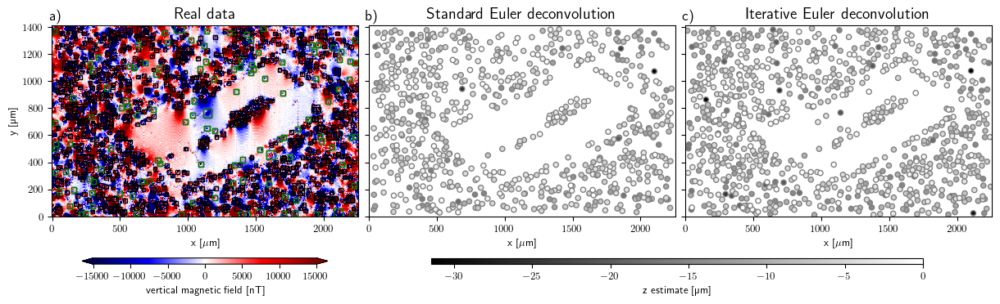

In [40]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    axes = axes.ravel()

    ax = axes[0]
    tmp1 = data['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_enhanced:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)

    for window in non_overlapping_windows:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="g",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    tmp = ax.scatter(*positions_itr_enhanced[:2], c=positions_itr_enhanced[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid escape sequence '\c'
<>:197: DeprecationWarning: invalid escape sequence '\c'
<>:199: DeprecationWarning: invalid escape sequence '\c'
<>:201: DeprecationWarning: invalid escape sequence '\c'
<>:203: DeprecationWarning: invalid escape sequence '\c'
<>:206: DeprecationWarning: invalid escape sequence '\g'
<>:207: DeprecationWarning: invalid escape sequence '\g'
<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid e

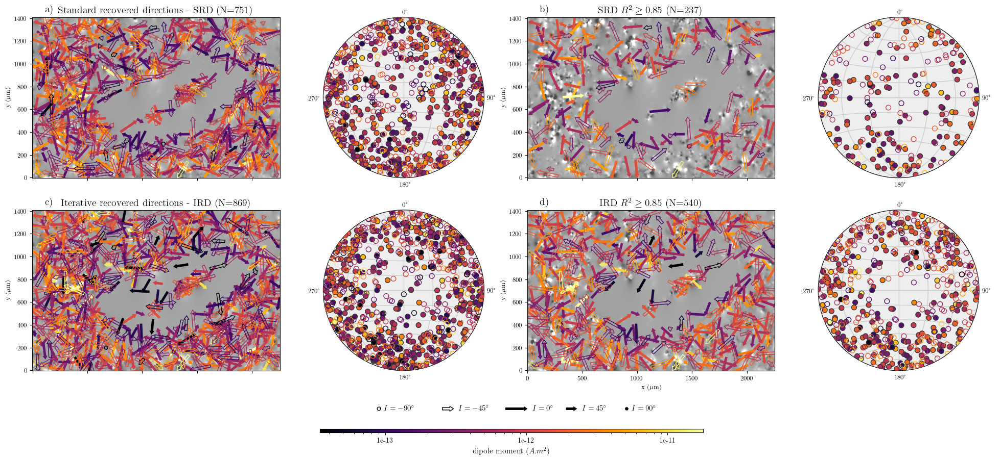

In [41]:
import warnings
warnings.filterwarnings('ignore')

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler_enhanced, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq 0.85$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq 0.85$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

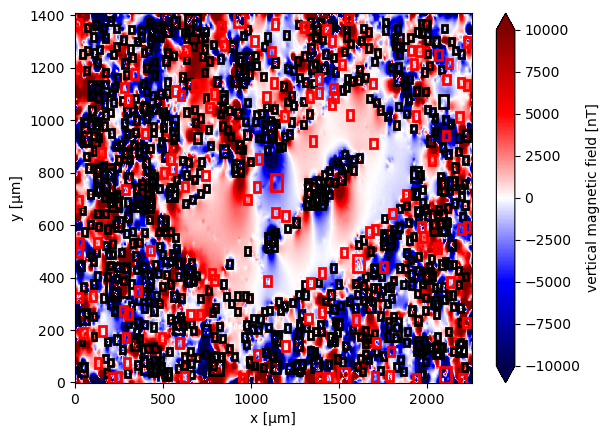

In [42]:
ax = plt.subplot(111)
data_up_copy_2.bz.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-10000, vmax=10000)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [43]:
np.asarray(calculated_r2_itr_euler_enhanced).T

array([ 0.9709501 ,  0.95473919,  0.84358461,  0.98319982,  0.89848483,
        0.93982024,  0.97308764,  0.97814695,  0.91990375,  0.94908516,
        0.87982048,  0.97574598,  0.97062921,  0.65152862,  0.91606617,
        0.8596246 ,  0.05294499,  0.89146781,  0.82147915,  0.91869093,
        0.98058378,  0.95528254,  0.94115815,  0.91011886,  0.95932154,
        0.56744834,  0.67793675,  0.98260123,  0.96723557,  0.78042587,
        0.97957922,  0.97527145,  0.85791274,  0.93331195,  0.8596756 ,
        0.89833937,  0.76974594,  0.74656379,  0.96493389,  0.95063524,
        0.52506672,  0.65166532,  0.99079139,  0.96233892,  0.91996386,
        0.8898318 ,  0.86176793,  0.81889097,  0.93639779,  0.64700439,
        0.89640697,  0.91702353,  0.92245232,  0.94810067,  0.95175201,
        0.8135481 ,  0.94062512,  0.97484091,  0.67924399,  0.94156002,
        0.95403888,  0.9475263 , -0.03703019,  0.90119907,  0.92901702,
        0.91389654,  0.60712051,  0.79775656,  0.91579074,  0.65

# Show the observed and predicted data

In [44]:
predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced)
residuo = data.bz.values - predicted_data

data_up = data_up.assign(predicted_data=(['y','x'],predicted_data))
data_up.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}

error = data_up.bz.values - data_up.predicted_data.values

data_up = data_up.assign(error=(['y','x'],error))
data_up.error.attrs = {"long_name": "residual-data", "units": "nT"}

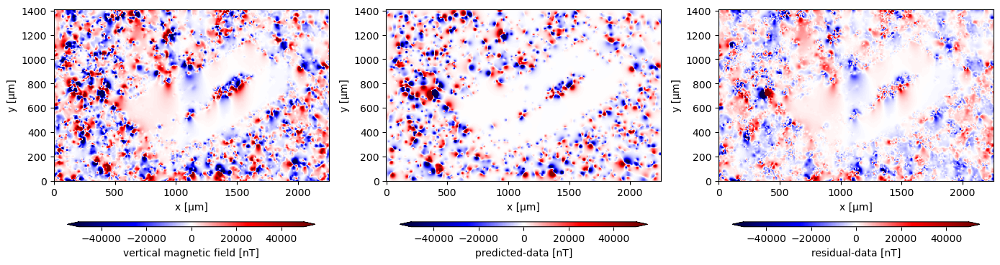

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "predicted_data", "error"], axes.ravel()):
    vmax = +50000
    vmin = -50000
    data_up[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

1
Individual source:   R2 = 0.9709501034741385


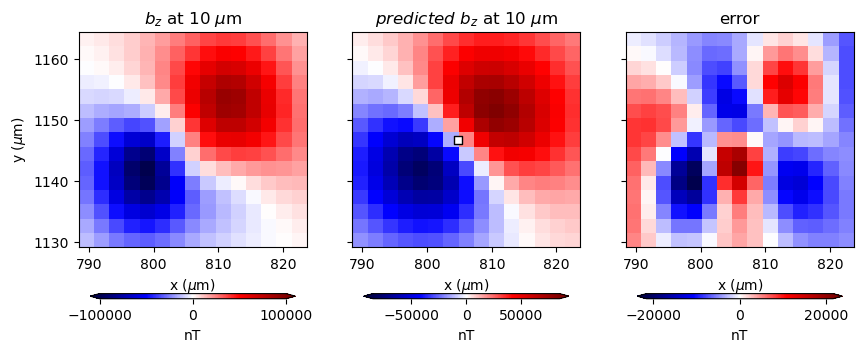

2
Individual source:   R2 = 0.9547391920567091


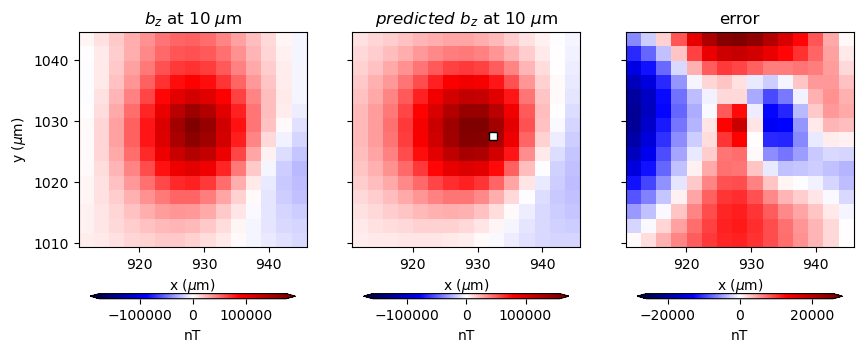

3
Individual source:   R2 = 0.8435846120751721


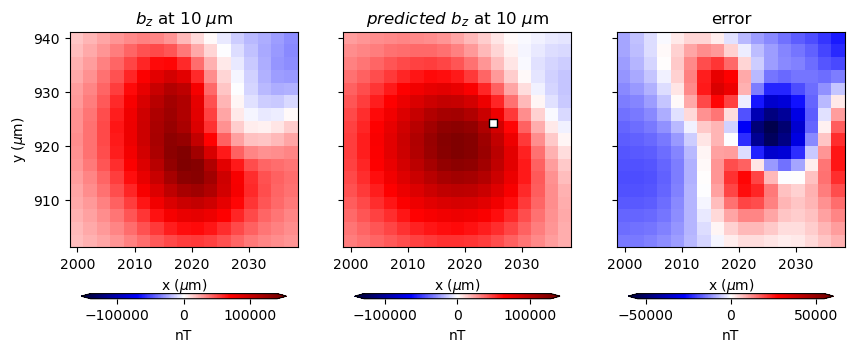

4
Individual source:   R2 = 0.9831998157106167


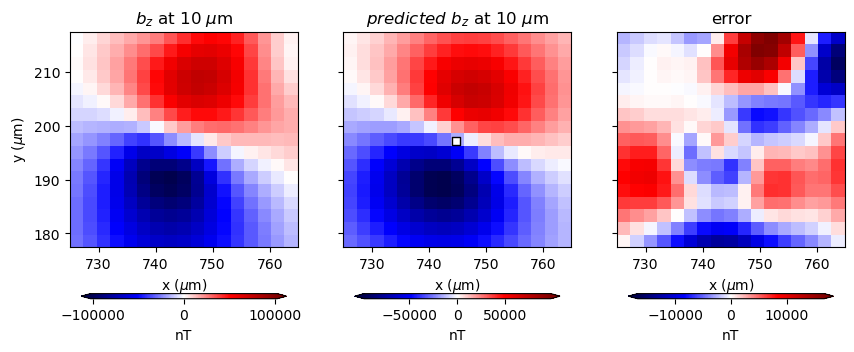

5
Individual source:   R2 = 0.8984848324917598


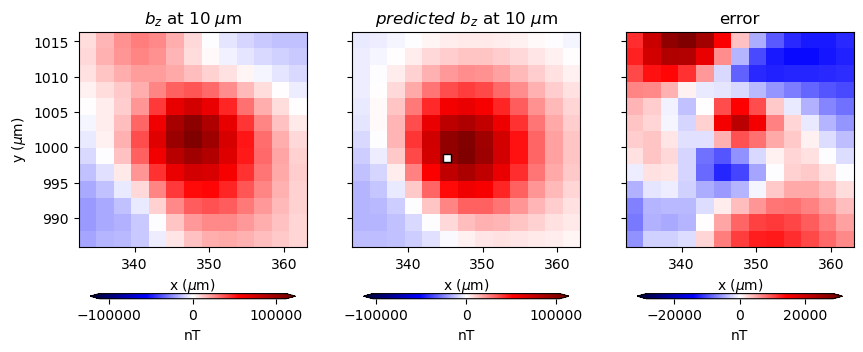

6
Individual source:   R2 = 0.9398202446215403


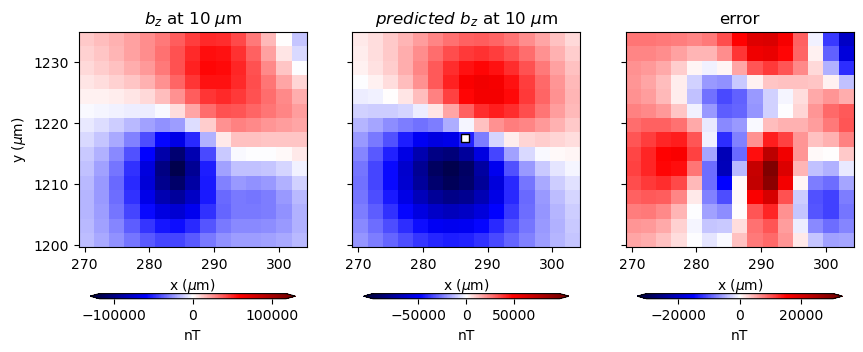

7
Individual source:   R2 = 0.9730876403111451


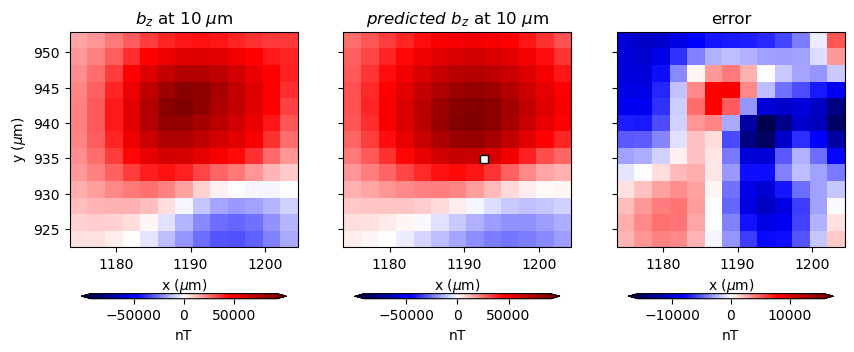

8
Individual source:   R2 = 0.9781469455759538


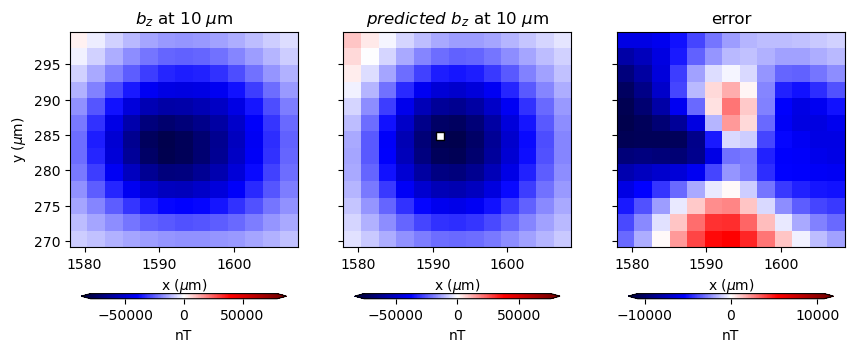

9
Individual source:   R2 = 0.9199037460638445


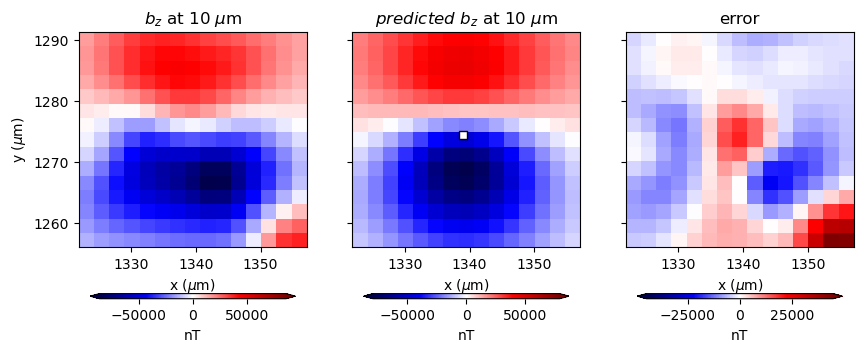

10
Individual source:   R2 = 0.9490851588663474


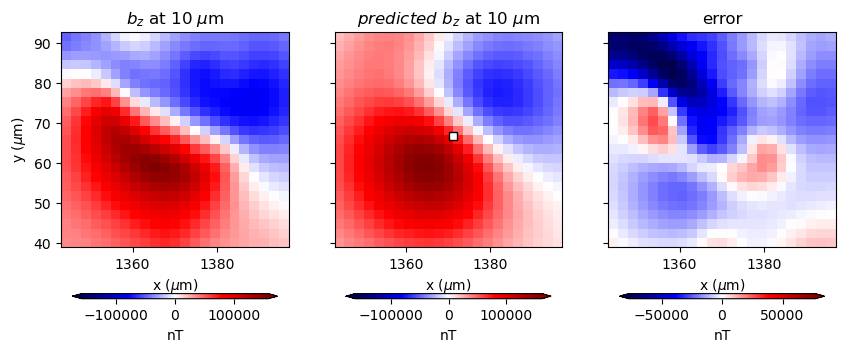

In [46]:
i = 0
slice_start=0#-20
slice_end=10#-1
for window, r2, base_level in zip(windows_enhanced[slice_start:slice_end], 
                                  calculated_r2_itr_euler_enhanced[slice_start:slice_end], 
                                  base_levels_itr_euler_enhanced[slice_start:slice_end]):

    if r2>=-np.inf:
        i=i+1
        print(i)
        # local_data = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        local_data = data_up.copy(deep=True)
        local_data = local_data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        
        fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey="row")
        axes = axes.ravel()    
        cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.9)
        
        ax = axes[0]
        ax.set_aspect("auto")
        ax.set_title(f"$b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        ax.set_ylabel("y ($\mu$m)")
        local_data.bz.values +- base_level
        tmp = local_data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        # ax.scatter(dipole_coordinates[0], dipole_coordinates[1], color='w', marker='o', edgecolors='k')
        
        ax = axes[1]
        ax.set_aspect("auto")
        ax.set_title(f"$predicted~b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        local_data.predicted_data.values += base_level
        tmp = local_data.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.scatter(positions_itr_enhanced[0], positions_itr_enhanced[1], color='w', marker='s', edgecolors='k')
        
        ax = axes[2]   
        ax.set_aspect("auto")
        ax.set_title("error")
        ax.set_xlabel("x ($\mu$m)")
        
        local_data.error.values = local_data.bz.values - local_data.predicted_data.values
        tmp = local_data.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        
    
        print(r"Individual source:   R2 = %s"%(r2))
    
        plt.show()

In [47]:
# Nome do arquivo ZIP
import os
output_folder = "csv_files_real_data"
os.makedirs(output_folder, exist_ok=True)

In [48]:
# Criar um DataFrame com os vetores
standard_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows)[:, 0],
    'xmax': np.asarray(windows)[:, 1],
    'ymin': np.asarray(windows)[:, 2],
    'ymax': np.asarray(windows)[:, 3],
    'xc_standard': np.asarray(positions)[0, :],
    'yc_standard': np.asarray(positions)[1, :],
    'zc_standard': np.asarray(positions)[2, :],
    'mx_standard': np.asarray(estimated_dipole_moments)[:,0],
    'my_standard': np.asarray(estimated_dipole_moments)[:,1],
    'mz_standard': np.asarray(estimated_dipole_moments)[:,2],
    'r_2_standard': np.asarray(calculated_r2),
})
standard_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_standard.csv'))
standard_dataframe.to_csv(standard_csv_name, index=False)

# Criar DataFrame para os vetores iterativos
iterative_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows_enhanced)[:, 0],
    'xmax': np.asarray(windows_enhanced)[:, 1],
    'ymin': np.asarray(windows_enhanced)[:, 2],
    'ymax': np.asarray(windows_enhanced)[:, 3],
    'xc_iterative': np.asarray(positions_itr_enhanced)[0, :],
    'yc_iterative': np.asarray(positions_itr_enhanced)[1, :],
    'zc_iterative': np.asarray(positions_itr_enhanced)[2, :],
    'mx_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,0],
    'my_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,1],
    'mz_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,2],
    'r_2_iterative': np.asarray(calculated_r2_itr_euler_enhanced),
})

# # Salvar DataFrame iterativo como CSV
iterative_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_iterative.csv'))
iterative_dataframe.to_csv(iterative_csv_name, index=False)